### Little bee

In [69]:
#%%
import numpy as np
import wave
import struct
import IPython.display as ipd
import matplotlib.pyplot as plt
from scipy.io.wavfile import write


In [70]:

def note(pitch,beat):
    fs = 44000
    amplitude = 30000
    frequency = np.array([261.6,293.7,329.6,349.2,392.0,440.0,493.9])
    num_samples = beat * fs
    t = np.linspace(0,beat,num_samples,endpoint=False)
    a = np.linspace(0,1,num_samples,endpoint=False)
    x = amplitude*a*np.cos(2*np.pi*frequency[pitch-1]*t)
    return x



In [71]:
file = "little_bee.wav"
pitches = np.array([5,3,3,4,2,2,1,2,3,4,5,5,5,
                  5,3,3,4,2,2,1,3,5,5,3,
                  2,2,2,2,2,3,4,3,3,3,3,3,4,5,
                  5,3,3,4,2,2,1,3,5,5,1])

beats = np.array([1,1,2,1,1,2,1,1,1,1,1,1,2,
                 1,1,2,1,1,2,1,1,1,1,4,
                 1,1,1,1,1,1,2,1,1,1,1,1,1,2,
                 1,1,2,1,1,2,1,1,1,1,4])

tempo = 1
fs = 44000
duration = sum(beats)*tempo
num_samples = int(duration*fs)
num_samples = int(np.round(duration * fs))
num_channel = 1
samwidth = 2

num_frames = num_samples
comptype = "NONE"
compname = "not compressed"
num_notes = np.size(pitches)

y = np.array([])
for i in range(num_notes):
    x = note(pitches[i],beats[i]*tempo)
    y = np.append(y,x)

y = y/y.max()

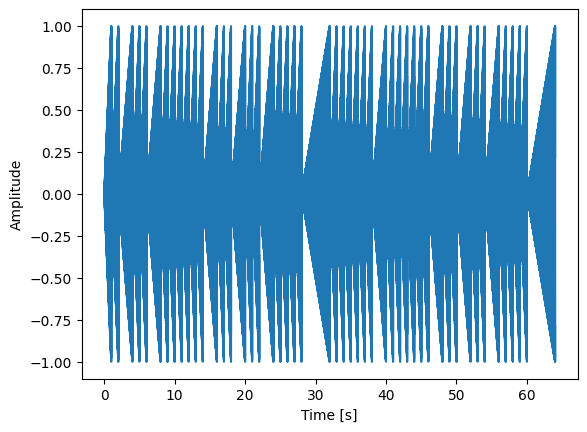

In [72]:
ipd.display(ipd.Audio(y,rate=2.5*fs))

t = np.arange(0, y.size/fs, 1/fs)
plt.plot(t, y, label='Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.show()

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

def pulse_wave(frequency, duration, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = np.sign(np.sin(2 * np.pi * frequency * t))
    return wave

def triangle_wave(frequency, duration, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = 2 * np.abs(2 * (t * frequency - np.floor(t * frequency + 0.5)))
    wave = wave - 1
    return wave

def noise(duration, fs):
    return np.random.normal(0, 1, int(fs * duration))

# 合成聲音
fs = 44100  # 取樣率
duration = 0.5  # 聲音持續時間（秒）

pulse_channel1 = pulse_wave(440, duration, fs)
pulse_channel2 = pulse_wave(660, duration, fs)

triangle_channel = triangle_wave(220, duration, fs)

noise_channel = noise(duration, fs)

synthesized_sound = (pulse_channel1 + pulse_channel2 + triangle_channel + noise_channel) / 4.0

# plt.figure(figsize=(14, 5))
# plt.plot(np.arange(0, len(synthesized_sound)) / fs, synthesized_sound)
# plt.title('Synthesized Sound Waveform')
# plt.xlabel('Time (seconds)')
# plt.ylabel('Amplitude')
# plt.show()

ipd.display(ipd.Audio(synthesized_sound, rate=fs))


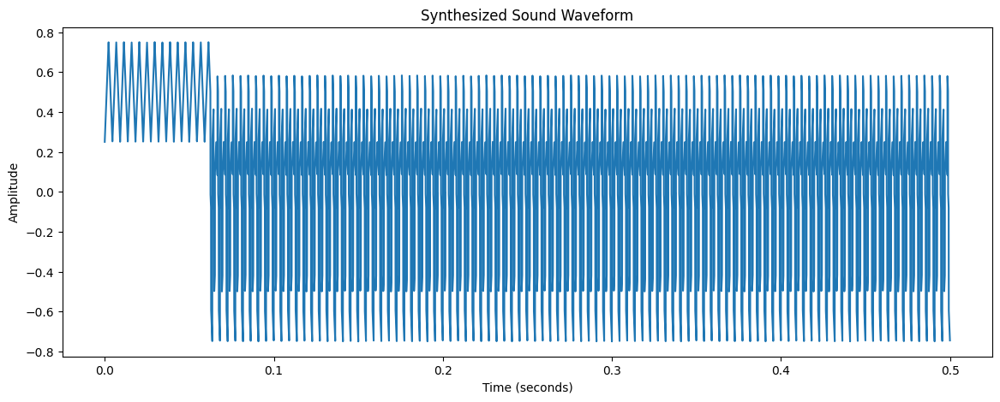

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

def pulse_wave_with_duty_cycle(frequency, duration, fs, duty_cycle):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = np.sign(np.sin(2 * np.pi * frequency * t))
    on_samples = int(fs * duration * duty_cycle)
    wave[:on_samples] = 1
    return wave


def pulse_wave(frequency, duration, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = np.sign(np.sin(2 * np.pi * frequency * t))
    return wave

def triangle_wave(frequency, duration, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = 2 * np.abs(2 * (t * frequency - np.floor(t * frequency + 0.5)))
    wave = wave - 1
    return wave

def noise(duration, fs):
    return np.random.normal(0, 1, int(fs * duration))


fs = 44100  # 取樣率
duration = 0.5  # 持續時間

# pulse_channel1 = pulse_wave(440, duration, fs)
# pulse_channel2 = pulse_wave(660, duration, fs)
pulse_channel1 = pulse_wave_with_duty_cycle(440, duration, fs, duty_cycle=0.125)
pulse_channel2 = pulse_wave_with_duty_cycle(660, duration, fs, duty_cycle=0.125)

triangle_channel = triangle_wave(220, duration, fs)

noise_channel = 0*noise(duration, fs)

synthesized_sound = (pulse_channel1 + pulse_channel2 + triangle_channel + noise_channel) / 4.0

plt.figure(figsize=(14, 5))
plt.plot(np.arange(0, len(synthesized_sound)) / fs, synthesized_sound)
plt.title('Synthesized Sound Waveform')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.show()

ipd.display(ipd.Audio(synthesized_sound, rate=fs))
# write('ex1.wav', fs, (synthesized_sound * 32767).astype(np.int16))

### Rect & tri wave spec

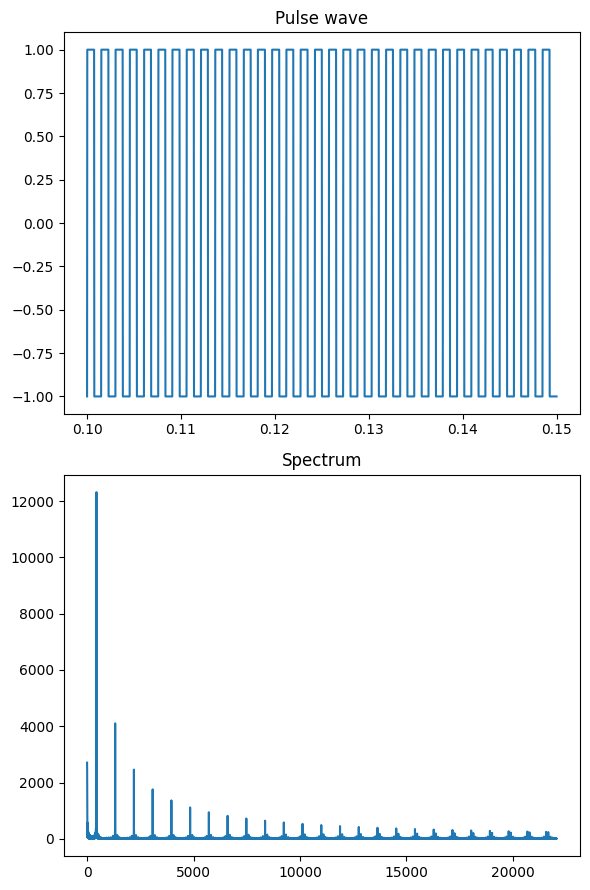

In [65]:
from scipy.fft import fft, fftfreq

Y = np.abs(fft(pulse_channel1))
ff = fftfreq(len(Y), 1/fs)

fig, ax = plt.subplots(2, 1, figsize=(6, 9))
ax[0].plot(np.arange(0.1, 0.15, 1/fs), pulse_channel2[int(fs*0.1):int(fs*0.15)])
ax[0].set_title('Pulse wave')
ax[1].plot(ff[:int(len(Y)/2)], Y[:int(len(Y)/2)])
ax[1].set_title('Spectrum')
plt.tight_layout()

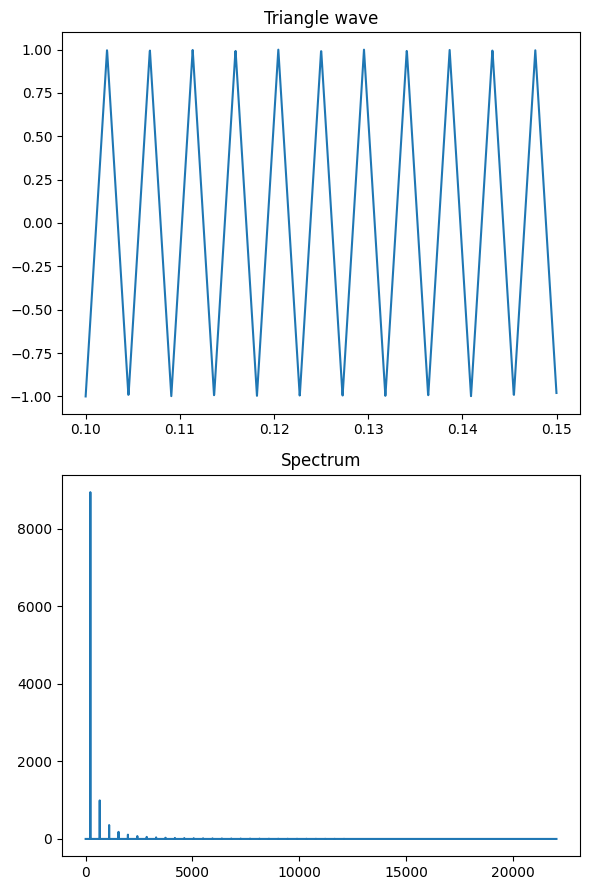

In [66]:
Y = np.abs(fft(triangle_channel))
ff = fftfreq(len(Y), 1/fs)

fig, ax = plt.subplots(2, 1, figsize=(6, 9))
ax[0].plot(np.arange(0.1, 0.15, 1/fs), triangle_channel[int(fs*0.1):int(fs*0.15)])
ax[0].set_title('Triangle wave')
ax[1].plot(ff[:int(len(Y)/2)], Y[:int(len(Y)/2)])
ax[1].set_title('Spectrum')
plt.tight_layout()

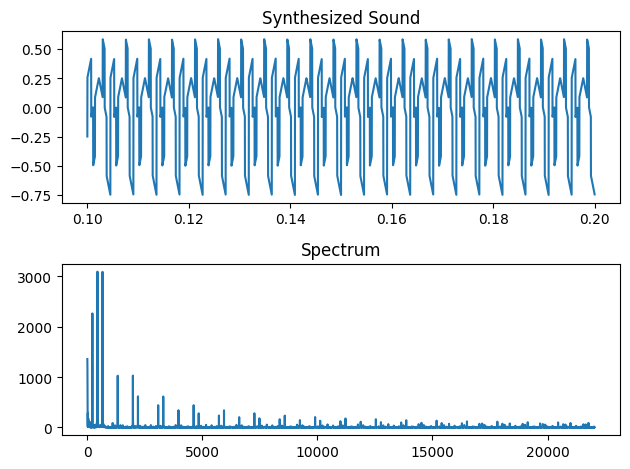

In [54]:
Y = np.abs(fft(synthesized_sound))
ff = fftfreq(len(Y), 1/fs)

fig, ax = plt.subplots(2, 1)
ax[0].plot(np.arange(0.1, 0.2, 1/fs), synthesized_sound[int(fs*0.1):int(fs*0.2)])
ax[0].set_title('Synthesized Sound')
ax[1].plot(ff[:int(len(Y)/2)], Y[:int(len(Y)/2)])
ax[1].set_title('Spectrum')
plt.tight_layout()

"C4"（中央 C）：261.63 Hz
"D4"：293.66 Hz
"E4"：329.63 Hz
"F4"：349.23 Hz
"G4"：392.00 Hz
"A4"：440.00 Hz
"B4"：493.88 Hz

Super Mario Bros. : Main Theme
33 3 135 低音5 1

節拍器  
BPM

這組音樂只要花多少儲存空間
價值是什麼？（看影片）

### mp3 to wav

In [2]:
from pydub import AudioSegment

mp3_file = 'mario-theme.mp3'

audio = AudioSegment.from_mp3(mp3_file)
fs = audio.frame_rate
duration = audio.duration_seconds
channels = audio.channels
print(fs, duration, channels)

48000 81.984 2


In [2]:
audio.export('mario-theme.wav', format='wav')

<_io.BufferedRandom name='mario-theme.wav'>

### Read wav file

(1807748,)


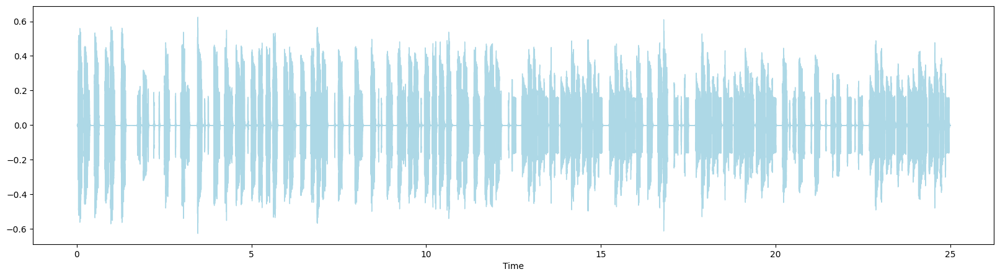

In [67]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from scipy.signal import find_peaks, windows

filename = 'mario-theme.wav'
# y, fs = librosa.load(filename, mono=False)
y, fs = librosa.load(filename)
print(y.shape)

dur = 25
y = y[:int(fs*dur)]

ipd.display(ipd.Audio(y, rate=fs))

plt.figure(figsize=(20, 5))
librosa.display.waveshow(y, sr=fs, color='lightblue')
plt.show()

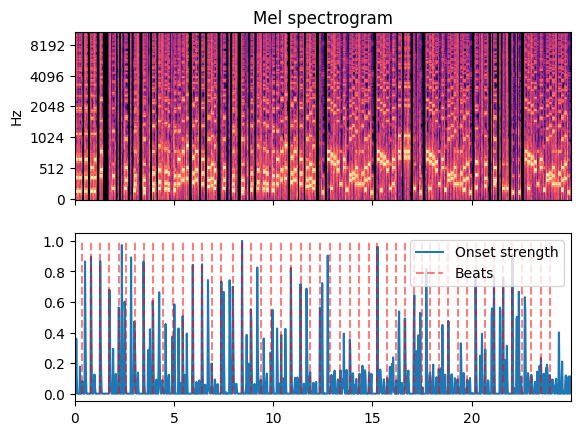

In [68]:
onset_env = librosa.onset.onset_strength(y=y, sr=fs, aggregate=np.median)
tempo, beats = librosa.beat.beat_track(y=y, sr=fs)

hop_length = 512
fig, ax = plt.subplots(nrows=2, sharex=True)
times = librosa.times_like(onset_env, sr=fs, hop_length=hop_length)
M = librosa.feature.melspectrogram(y=y, sr=fs, hop_length=hop_length)
librosa.display.specshow(librosa.power_to_db(M, ref=np.max),
                         y_axis='mel', x_axis='time', hop_length=hop_length,
                         ax=ax[0])
ax[0].label_outer()
ax[0].set(title='Mel spectrogram')
ax[1].plot(times, librosa.util.normalize(onset_env),
         label='Onset strength')
ax[1].vlines(times[beats], 0, 1, alpha=0.5, color='r',
           linestyle='--', label='Beats')
ax[1].legend()

In [21]:
M.shape

(128, 1077)

### STFT

In [69]:
S = np.abs(librosa.stft(y))    # default: n_fft=win_length=2048, hop_length=nfft/4=512 
ff = librosa.fft_frequencies(sr=fs)
print(S.shape)
num_frames = S.shape[1]

# freqs = np.zeros((num_frames, 3))   # 3 main frequency
tri_freq = np.zeros((num_frames, 1))
rec_freq = np.zeros((num_frames, 2))

for frame in range(num_frames):
    peaks, _ = find_peaks(S[:, frame], height=10)  # 設定峰值的閾值

    # 去掉頻率相近的 peaks
    for i in range(len(peaks)-1):
        if peaks[i+1] - peaks[i] < 5:
            peaks[i+1] = int((peaks[i+1] + peaks[i]) / 2)
            peaks[i] = 0
    peaks = peaks[peaks != 0]

    # 找出兩個方波頻率
    ch = 0        
    if len(peaks) > 3:
        # print(frame, peaks)
        tri_freq[frame] = ff[peaks[0]]
        for j in range(len(peaks)):
            for k in range(j+1, len(peaks)):
                if abs((ff[peaks[k]] / ff[peaks[j]]) - 3) < 0.1 and ch <= 1:
                    rec_freq[frame, ch] = ff[peaks[j]]
                    ch += 1
        # print(tri_freq[frame], rec_freq[frame, :])


(1025, 1077)


In [36]:
rec_freq

array([[  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [366.06445312, 667.52929688],
       [366.06445312, 656.76269531],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [366.06445312, 667.52929688],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [  0.        ,   0.        ],
       [150.73242188, 366.06445312],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
       [366.06445312, 656.76269531],
 

### Synthesis

In [70]:
def pulse_wave(frequency, duration, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = np.sign(np.sin(2 * np.pi * frequency * t))
    return wave

def triangle_wave(frequency, duration, fs):
    t = np.linspace(0, duration, int(fs * duration), endpoint=False)
    wave = 2 * np.abs(2 * (t * frequency - np.floor(t * frequency + 0.5)))
    wave = wave - 1
    return wave

def noise(duration, fs):
    return np.random.normal(0, 1, int(fs * duration))

# 合成聲音
fs = 22050  # 取樣率
frame_length = 2048
hop_size = 512
duration = frame_length / fs  # 聲音持續時間（秒）
win = windows.hann(frame_length)

synthesized_sound = np.zeros((num_frames-1)*hop_size+frame_length)
# synthesized_sound_out = np.zeros((num_frames-1)*hop_size+frame_length)
pulse1_sound = np.zeros((num_frames-1)*hop_size+frame_length)
pulse2_sound = np.zeros((num_frames-1)*hop_size+frame_length)
triangle_sound = np.zeros((num_frames-1)*hop_size+frame_length)
noise_sound = np.zeros((num_frames-1)*hop_size+frame_length)

for frame in range(num_frames):
    pulse_channel1 = pulse_wave(rec_freq[frame, 0], duration, fs)
    pulse_channel2 = pulse_wave(rec_freq[frame, 1], duration, fs)
    triangle_channel = triangle_wave(tri_freq[frame], duration, fs)
    noise_channel = np.zeros(frame_length)
    if frame in beats:
        noise_channel = noise(duration, fs)

    # y_win = ((pulse_channel1 + pulse_channel2 + triangle_channel + noise_channel) / 4.0) * win
    y_win = ((pulse_channel1 + pulse_channel2 + triangle_channel) / 3.0) * win
    # y_out = ((pulse_channel1 + pulse_channel2 + triangle_channel) / 3.0)
    y_1 = pulse_channel1 * win
    y_2 = pulse_channel2 * win
    y_3 = triangle_channel * win
    y_4 = noise_channel * win

    synthesized_sound[frame*hop_size:frame*hop_size+frame_length] = y_win + synthesized_sound[frame*hop_size:frame*hop_size+frame_length]
    # synthesized_sound_out[frame*hop_size:frame*hop_size+frame_length] = y_out + synthesized_sound_out[frame*hop_size:frame*hop_size+frame_length]

    pulse1_sound[frame*hop_size:frame*hop_size+frame_length] = y_1 + pulse1_sound[frame*hop_size:frame*hop_size+frame_length]
    pulse2_sound[frame*hop_size:frame*hop_size+frame_length] = y_2 + pulse2_sound[frame*hop_size:frame*hop_size+frame_length]
    triangle_sound[frame*hop_size:frame*hop_size+frame_length] = y_3 + triangle_sound[frame*hop_size:frame*hop_size+frame_length]
    noise_sound[frame*hop_size:frame*hop_size+frame_length] = y_4 + noise_sound[frame*hop_size:frame*hop_size+frame_length]

In [26]:
ipd.display(ipd.Audio(noise_sound, rate=fs))

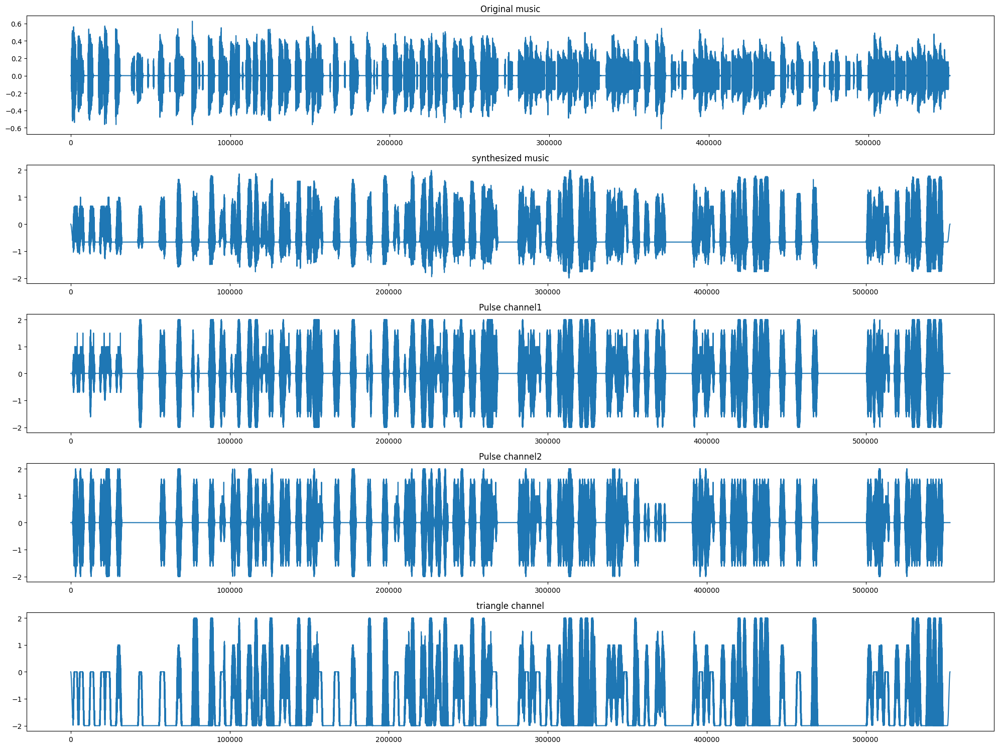

In [71]:
ipd.display(ipd.Audio(y, rate=fs))
ipd.display(ipd.Audio(synthesized_sound, rate=fs))
# ipd.display(ipd.Audio(synthesized_sound_out, rate=fs))
ipd.display(ipd.Audio(pulse1_sound, rate=fs))
ipd.display(ipd.Audio(pulse2_sound, rate=fs))
ipd.display(ipd.Audio(triangle_sound, rate=fs))

fig, ax = plt.subplots(5, 1, figsize=(20, 15))
ax[0].plot(y)
ax[0].set_title('Original music')
ax[1].plot(synthesized_sound)
ax[1].set_title('synthesized music')
ax[2].plot(pulse1_sound)
ax[2].set_title('Pulse channel1')
ax[3].plot(pulse2_sound)
ax[3].set_title('Pulse channel2')
ax[4].plot(triangle_sound)
ax[4].set_title('triangle channel')
plt.tight_layout()

Text(0.5, 1.0, 'Find frequency peaks')

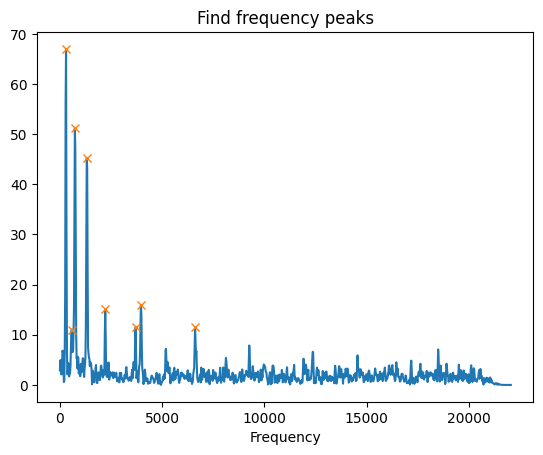

In [59]:
peaks, _ = find_peaks(S[:, 2], height=10)
ff = librosa.fft_frequencies(sr=fs)
plt.plot(ff, S[:, 2])
plt.plot(ff[peaks], S[peaks, 2], 'x', label='Peaks')
plt.xlabel('Frequency')
plt.title('Find frequency peaks')

### STFT

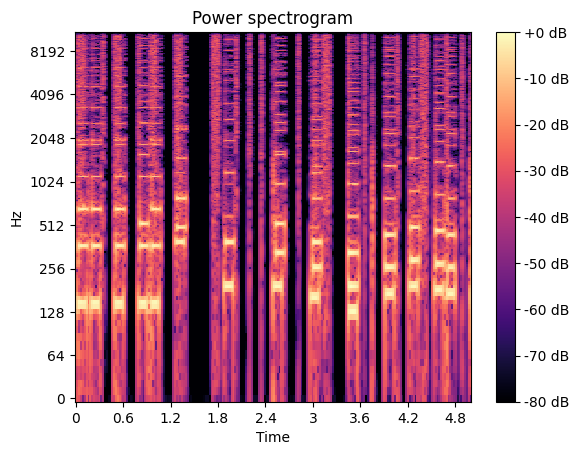

In [9]:
S = np.abs(librosa.stft(y[:fs*dur]))    # default: n_fft=win_length=2048, hop_length=nfft/4=512 

fig, ax = plt.subplots()
img = librosa.display.specshow(
    librosa.amplitude_to_db(S, ref=np.max),
    y_axis='log', x_axis='time', ax=ax)
ax.set_title('Power spectrogram')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
plt.show()

In [61]:
2.4/(512/fs)

103.359375

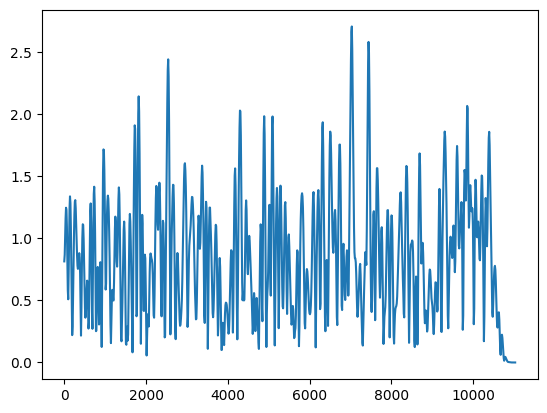

In [64]:
from scipy.signal import find_peaks

frame = 102
peaks, _ = find_peaks(S[:, frame], height=10)  # 設定峰值的閾值

ff = librosa.fft_frequencies(sr=fs)
plt.plot(ff, S[:, frame])
plt.plot(ff[peaks], S[peaks, frame], 'x', label='Peaks')

In [54]:
peaks

array([ 27,  41,  65, 123, 195])

In [56]:
ff[peaks]

array([ 290.69824219,  441.43066406,  699.82910156, 1324.29199219,
       2099.48730469])

In [60]:
2099.48730469/699.82910156

3.0000000000142895

## Melspec

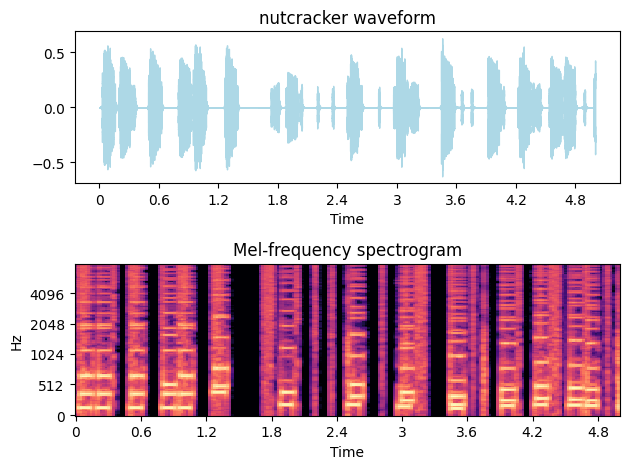

In [64]:
ipd.display(ipd.Audio(y[:fs*dur], rate=fs))

fig, ax = plt.subplots(2, 1)

# 繪製波形圖
librosa.display.waveshow(y[:fs*dur], sr=fs, ax=ax[0], color='lightblue')
ax[0].set_title('nutcracker waveform')

# 繪製梅爾頻譜圖
S = librosa.feature.melspectrogram(y=y[:fs*dur], sr=fs, n_mels=128, fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=fs,
                         fmax=8000, ax=ax[1])
ax[1].set_title('Mel-frequency spectrogram')

plt.tight_layout()
plt.show()

In [65]:
# 假設 S_dB 是你的 Mel-frequency spectrogram
# 你可能已經繪製了 S_dB，然後想找出某個音框內的最大值相對應的頻率

# 假設 frame_index 是你感興趣的音框的索引
frame_index = 56  # 替換為你想要的音框索引

# 在 Mel-frequency spectrogram 中找出某個音框的最大值的索引
max_freq_index = np.argmax(S_dB[:, frame_index])

# 使用索引找到對應的頻率
max_freq = librosa.mel_frequencies(n_mels=128, fmax=8000)[max_freq_index]

print(f"The maximum frequency in frame {frame_index} is {max_freq} Hz.")


The maximum frequency in frame 56 is 475.0198474742779 Hz.


In [40]:
S_dB[:, 52].argsort()

array([120, 121,  57,  58,  61,  62, 114, 103,  53, 111, 126,  63,  54,
        60,  85, 119,  56,  95, 125,   3, 102,  59,  76,  89,  55,  75,
       109,  77,  86, 123,   2,   0, 117, 115,  99,  80,  98, 122, 127,
       124,  97,   1, 118,  90,  96,  81,   4, 110, 112, 113,  88, 116,
        91, 108,  52, 100,  74,  82, 105, 106,  79, 104, 107,  87, 101,
        93,  83,  94,  64,   6,  84,  92,   5,  78,   7,  73,   9,  45,
        51,   8,  70,  33,  65,  10,  46,  13,  50,  69,  71,  22,  72,
        47,  66,  44,  68,  40,  27,  39,  34,  28,  20,  49,  23,  67,
        29,  21,  12,  11,  41,  35,  16,  38,  32,  17,  36,  48,  26,
        37,  43,  19,  42,  14,  18,  30,  24,  15,  25,  31])

In [41]:
ff[31]

736.2807635851307